# Supervised Learning - Project

In this Project, we are going to perform a full supervised learning machine learning project on a "Diabetes" dataset. This dataset is originally from the National Institute of Diabetes and Digestive and Kidney
Diseases. The objective of the dataset is to diagnostically predict whether a patient has diabetes,
based on certain diagnostic measurements included in the dataset. 

[Kaggle Dataset](https://www.kaggle.com/datasets/akshaydattatraykhare/diabetes-dataset)

# Part I : EDA - Exploratory Data Analysis

For this task, you are required to conduct an exploratory data analysis on the diabetes dataset. You have the freedom to choose the visualizations you want to use, but your analysis should cover the following tasks mostly:

- Are there any missing values in the dataset?
- How are the predictor variables related to the outcome variable?
- What is the correlation between the predictor variables?
- What is the distribution of each predictor variable?
- Are there any outliers in the predictor variables?
- How are the predictor variables related to each other?
- Is there any interaction effect between the predictor variables?
- What is the average age of the individuals in the dataset?
- What is the average glucose level for individuals with diabetes and without diabetes?
- What is the average BMI for individuals with diabetes and without diabetes?
- How does the distribution of the predictor variables differ for individuals with diabetes and without diabetes?
- Are there any differences in the predictor variables between males and females (if gender information is available)?

In [1]:
import pandas as pd   
import numpy as np    
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_formats = ['retina']
import seaborn as sns
import time
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, log_loss
from sklearn.metrics import auc, roc_curve, roc_auc_score, precision_recall_curve
from sklearn.metrics import fbeta_score, cohen_kappa_score
SEED = 42

In [3]:
df = pd.read_csv('diabetes.csv')
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


# Part II : Preprocessing & Feature Engineering

You need to perform preprocessing on the given dataset. Please consider the following tasks and carry out the necessary steps accordingly.
- Handling missing values
- Handling outliers
- Scaling and normalization
- Feature Engineering
- Handling imbalanced data

In [4]:
# data overview and to see if there any missing values. 
print ('Rows     : ', df.shape[0])
print ('Columns  : ', df.shape[1])
print ('\nFeatures : \n', df.columns.tolist())
print ('\nMissing values :  ', df.isnull().sum().values.sum())
print ('\nUnique values :  \n', df.nunique())
print('''We can see there aren't any missing values''')

Rows     :  768
Columns  :  9

Features : 
 ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']

Missing values :   0

Unique values :  
 Pregnancies                  17
Glucose                     136
BloodPressure                47
SkinThickness                51
Insulin                     186
BMI                         248
DiabetesPedigreeFunction    517
Age                          52
Outcome                       2
dtype: int64
We can see there aren't any missing values


In [5]:
#This provides information about the DataFrame, including the data types of each column, the number of non-null values in each column, and the total memory usage. 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [6]:
#this is used to find the number of missing (NaN or null) values in each column of the DataFrame 
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

# We will be cleaning the data, dealing with outliers, 0 and NaN values

In [7]:
# Since there are zero values in BloodPressure, SkinThickness, Insulin, BMI
# We'll need to replace zero to NaN value then change it to median value (so that 0 will not affect median)
# after this step, run previous visualisation again
#We would replace 0 values for glucose since it is posssible to have 0 in your glucose levels

#df.Glucose.replace(np.nan, df['Glucose'].median(), inplace=True)
df.BloodPressure.replace(0, np.nan, inplace=True)
df.BloodPressure.replace(np.nan, df['BloodPressure'].median(), inplace=True)
df.SkinThickness.replace(0, np.nan, inplace=True)
df.SkinThickness.replace(np.nan, df['SkinThickness'].median(), inplace=True)
df.Insulin.replace(0, np.nan, inplace=True)
df.Insulin.replace(np.nan, df['Insulin'].median(), inplace=True)
df.BMI.replace(0, np.nan, inplace=True)
df.BMI.replace(np.nan, df['BMI'].median(), inplace=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    float64
 3   SkinThickness             768 non-null    float64
 4   Insulin                   768 non-null    float64
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(5), int64(4)
memory usage: 54.1 KB


In [9]:
#clean and remove outliers 
df = df[(df['Glucose'] > 0) &
        (df['BloodPressure'] > 40) & (df['BloodPressure'] < 101) &
        (df['SkinThickness'] > 0) & (df['SkinThickness'] < 61) &  
        (df['Insulin'] > 0) & (df['Insulin'] < 350) &  
        (df['BMI'] > 0) & (df['BMI'] < 55) &
        (df['Pregnancies'] < 8) &
        (df['Age'] < 65) &  
        (df['DiabetesPedigreeFunction'] < 1.5) 
        ]
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,584.000000,584.000000,584.000000,584.000000,584.000000,584.000000,584.00000,584.000000,584.000000
mean,2.724315,118.089041,71.152397,28.386986,127.606164,32.021747,0.44558,30.255137,0.291096
std,2.180773,28.715000,10.750997,8.537531,53.548385,6.571950,0.27732,9.629232,0.454657
min,0.000000,44.000000,44.000000,7.000000,15.000000,18.200000,0.07800,21.000000,0.000000
25%,1.000000,97.750000,64.000000,23.000000,105.750000,27.300000,0.24250,23.000000,0.000000
50%,2.000000,113.000000,72.000000,29.000000,125.000000,32.000000,0.36150,27.000000,0.000000
75%,4.000000,134.000000,78.000000,32.000000,125.000000,36.025000,0.59150,34.250000,1.000000
max,7.000000,199.000000,100.000000,60.000000,342.000000,53.200000,1.46100,63.000000,1.000000


In [11]:
df.shape

(584, 9)

# this graph shows we removed the outliers

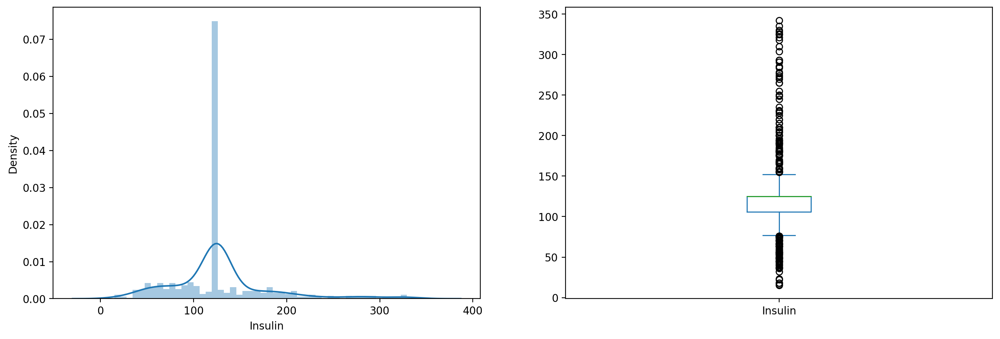

In [12]:
plt.subplot(121), sns.distplot(df['Insulin'])
plt.subplot(122), df['Insulin'].plot.box(figsize=(16,5))
plt.show()



In [13]:
print(df.isnull().sum())

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64


# We are going to check for outliers 

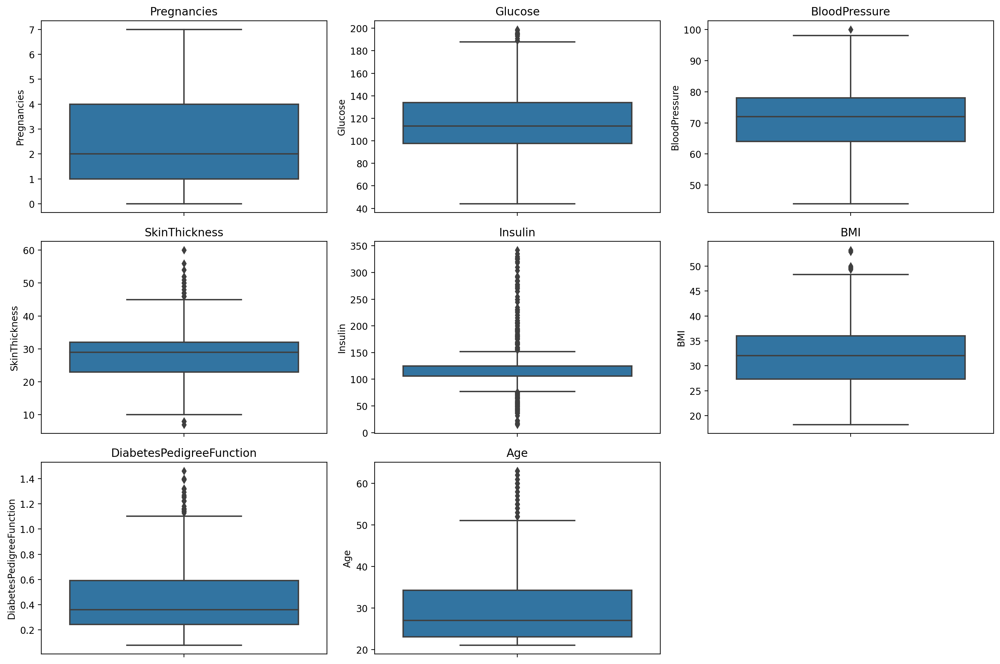

In [14]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(df.columns[:-1]):
    plt.subplot(3, 3, i+1)
    sns.boxplot(y=df[col])
    plt.title(col)
plt.tight_layout()
plt.show()

# This will show the distribution 

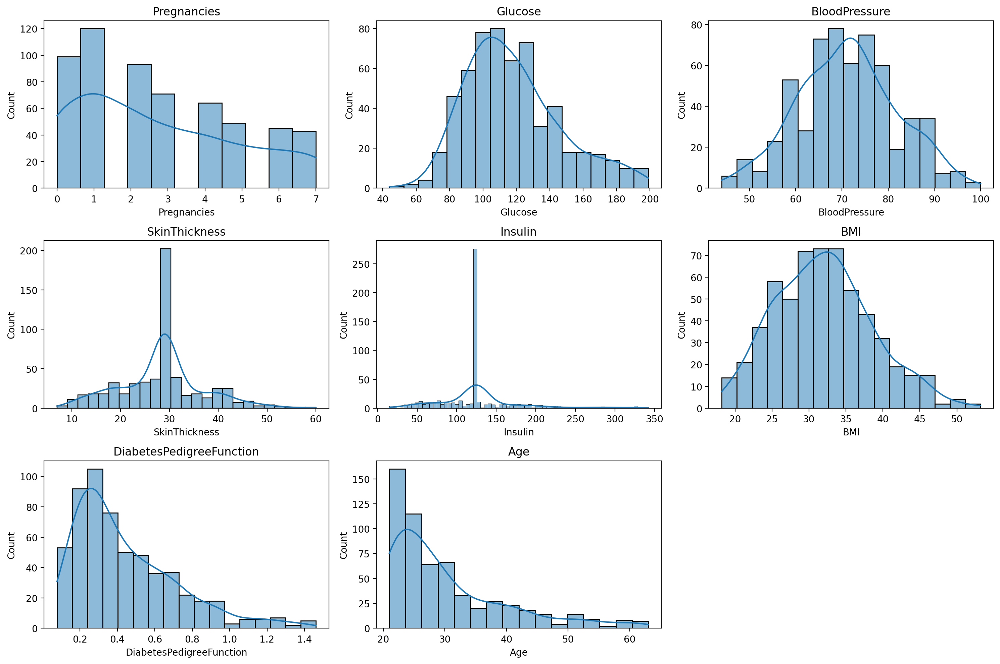

In [15]:

plt.figure(figsize=(15, 10))
for i, col in enumerate(df.columns[:-1]):
    plt.subplot(3, 3, i+1)
    sns.histplot(df[col], kde=True)
    plt.title(col)
plt.tight_layout()
plt.show()


# Average age, Average Glucose levels, Average BMI and difference in predicted variables between the male and female.

In [16]:
#Average Age 
average_age = df['Age'].mean()

#Average Glucose levels 
average_glucose_diabetes = df[df['Outcome'] == 1]['Glucose'].mean()
average_glucose_no_diabetes = df[df['Outcome'] == 0]['Glucose'].mean()

#Average BMI
average_bmi_diabetes = df[df['Outcome'] == 1]['BMI'].mean()
average_bmi_no_diabetes = df[df['Outcome'] == 0]['BMI'].mean()

#Difference in predicted variables between male and female
if 'Gender' in df.columns:
    gender_grouped = df.groupby('Gender')
    gender_means = gender_grouped.mean()

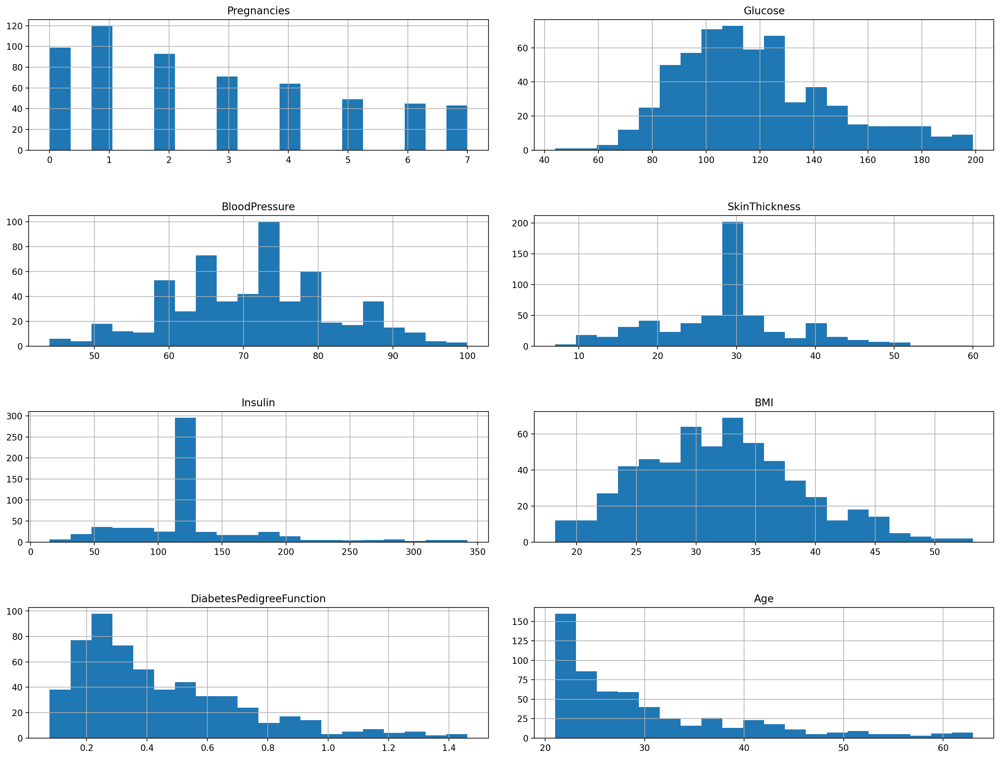

In [17]:
import pandas as pd
import matplotlib.pyplot as plt


col = df.columns[:8]
plt.subplots(figsize=(20, 15))
length = len(col)

# Determine the number of rows and columns for the subplot grid
rows = int(length / 2) + (length % 2)
cols = 2

for i, j in enumerate(col):
    plt.subplot(rows, cols, i + 1)
    plt.subplots_adjust(wspace=0.1, hspace=0.5)
    df[j].hist(bins=20)
    plt.title(j)

plt.show()


0    414
1    170
Name: Outcome, dtype: int64
We can see that there are 414 indivisuals without diabetes and 170 with diabetes


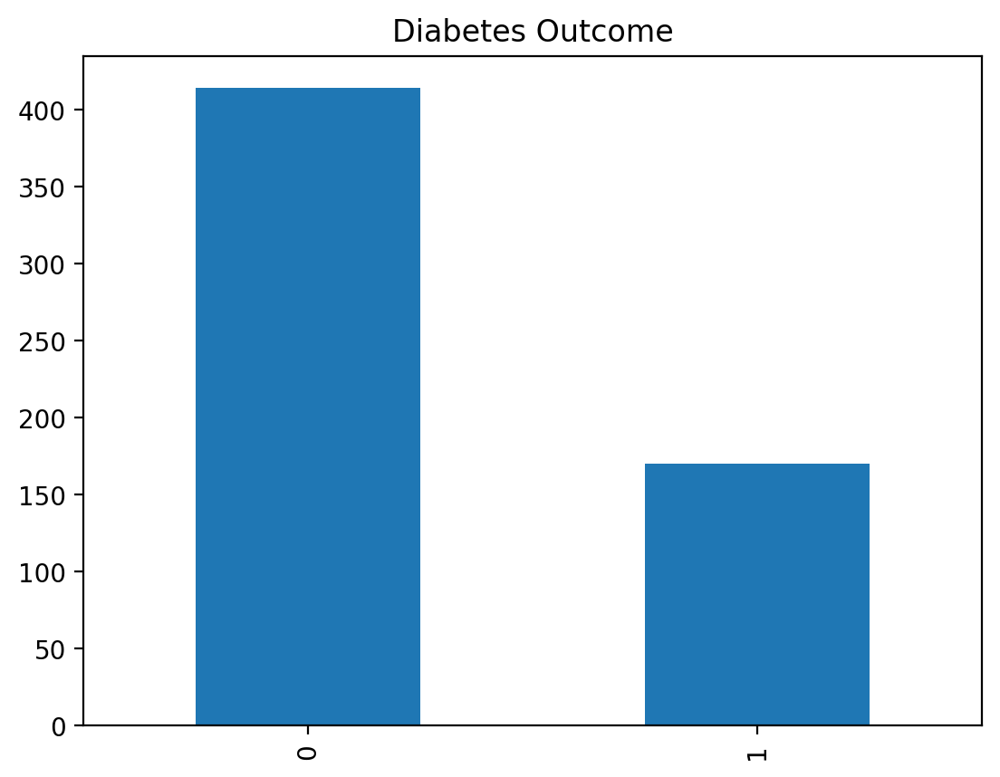

In [19]:
# '0'= no diabetes; '1'= diabetes
print(df.Outcome.value_counts())

#We will visualize the outcomes in a bar chart for clarity
df['Outcome'].value_counts().plot(kind='bar').set_title('Diabetes Outcome')
print('''We can see that there are 414 indivisuals without diabetes and 170 with diabetes''')

In [21]:
# We will visualise the pair plot
sns.pairplot(df, hue='Outcome', plot_kws=dict(alpha=1, edgecolor='none'), height=5, aspect=1.5)


KeyboardInterrupt: 

(9.5, -0.5)

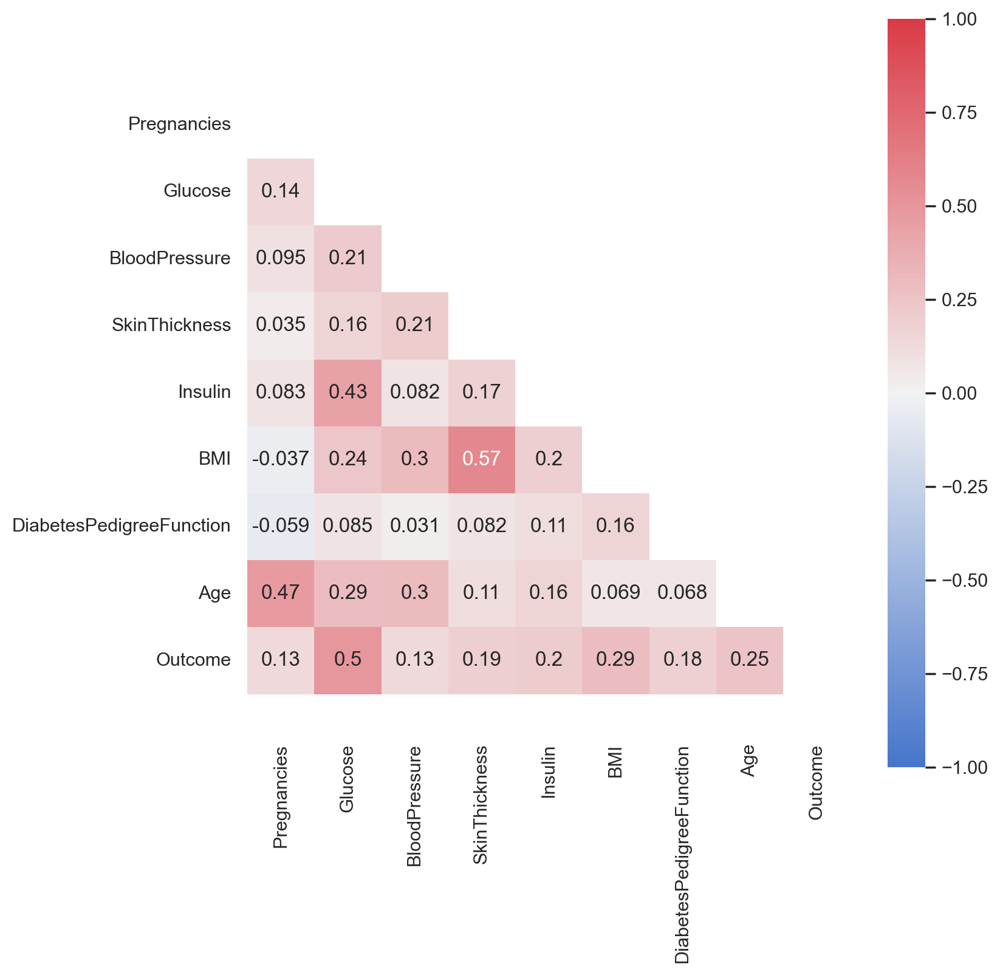

In [22]:
# Correlation Matrix Heatmap Visualization 
sns.set(style="white")


# Generate a mask for the upper triangle
mask = np.zeros_like(df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True


# Set up the matplotlib figure to control size of heatmap
fig, ax = plt.subplots(figsize=(8,8))


# Create a custom color palette
cmap = sns.diverging_palette(255, 10, as_cmap=True)  # as_cmap returns a matplotlib colormap object rather than a list of colors

# Red=10, Green=128, Blue=255

# Plot the heatmap
sns.heatmap(df.corr(), mask=mask, annot=True, square=True, cmap=cmap , vmin=-1, vmax=1, ax=ax)  # annot display corr label

# Prevent Heatmap Cut-Off Issue
bottom, top = ax.get_ylim()
ax.set_ylim(bottom+0.5, top-0.5)


# To analyse feature-outcome distribution in visualisation. here is a list containing the names of the columns (features) in the DataFrame that we want to plot the histograms for.

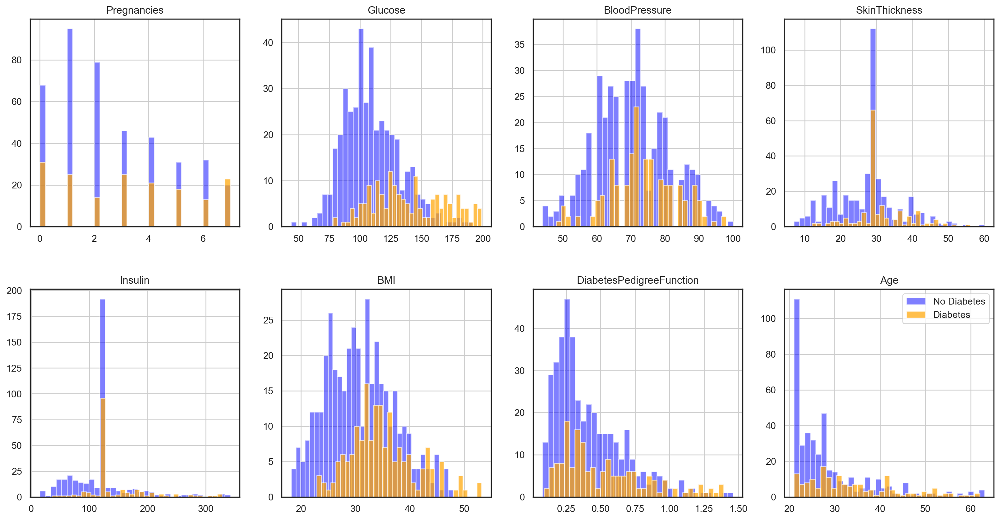

In [23]:
# To analyse feature-outcome distribution in visualisation. here is a list containing the names of the columns (features) 
#in the DataFrame that we want to plot the histograms for.
features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']


#This line sets the number of rows and columns for the grid of subplots. 
#The histograms will be arranged in 2 rows and 4 columns.

ROWS, COLS = 2, 4
fig, ax = plt.subplots(ROWS, COLS, figsize=(20,10) )
row, col = 0, 0


#The for loop iterates over each feature in the features list using enumerate to get both the 
#index (i) and the feature name (feature). This condition checks if we have reached the last column in the current row of subplots. 
#If so, it moves to the next row.

for i, feature in enumerate(features):
    if col == COLS - 1:
        row += 1
    col = i % COLS
    
#     df[feature].hist(bins=35, color='green', alpha=0.5, ax=ax[row, col]).set_title(feature)  #show all, comment off below 2 lines
    df[df.Outcome==0][feature].hist(bins=35, color='blue', alpha=0.5, ax=ax[row, col]).set_title(feature)
    df[df.Outcome==1][feature].hist(bins=35, color='orange', alpha=0.7, ax=ax[row, col])
    
plt.legend(['No Diabetes', 'Diabetes'])
fig.subplots_adjust(hspace=0.3)

# seaborn has an easy method to showcase heatmap

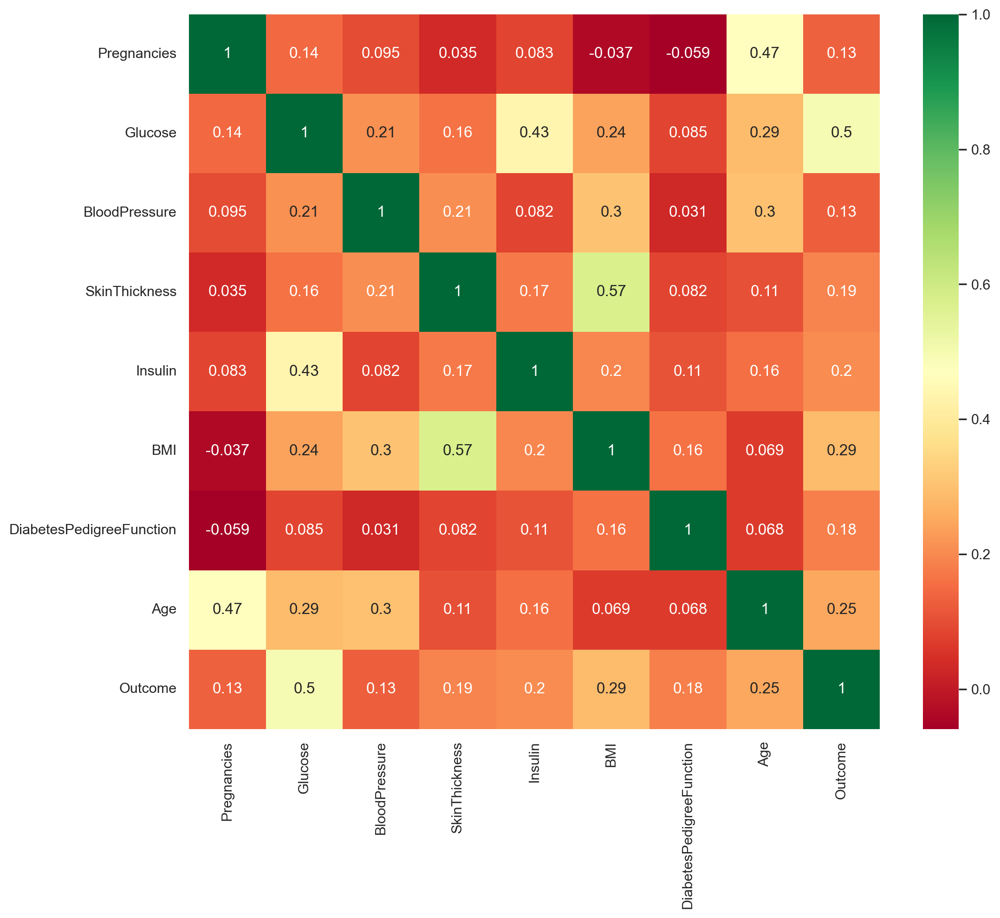

In [24]:
plt.figure(figsize=(12,10))

p = sns.heatmap(df.corr(), annot=True,cmap ='RdYlGn')

### ***Scaling Data***


In [25]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']] = scaler.fit_transform(df[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']])

In [28]:


# Separate the features (X) and the target (y)
X = df.drop(columns=['Outcome'], axis = 1)  
y = df['Outcome']



In [29]:
X.shape

(584, 8)

In [30]:
y.shape

(584,)

# Part III : Training ML Model

In [31]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score


# Step 1: Data Splitting
X = df.drop('Outcome', axis=1)  # Features
y = df['Outcome']  # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 2: Model Selection
# Logistic Regression
logreg_model = LogisticRegression(random_state=42)

# Random Forest
rf_model = RandomForestClassifier(random_state=42)

# Step 3: Training the Models
logreg_model.fit(X_train, y_train)
rf_model.fit(X_train, y_train)

# Step 4: Model Evaluation
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    return accuracy, precision, recall, f1, roc_auc

logreg_accuracy, logreg_precision, logreg_recall, logreg_f1, logreg_roc_auc = evaluate_model(logreg_model, X_test, y_test)
rf_accuracy, rf_precision, rf_recall, rf_f1, rf_roc_auc = evaluate_model(rf_model, X_test, y_test)


# Step 5: Model Comparison
print("Logistic Regression:")
print("Accuracy:", logreg_accuracy)
print("Precision:", logreg_precision)
print("Recall:", logreg_recall)
print("F1-score:", logreg_f1)
print("ROC-AUC:", logreg_roc_auc)

print("\nRandom Forest:")
print("Accuracy:", rf_accuracy)
print("Precision:", rf_precision)
print("Recall:", rf_recall)
print("F1-score:", rf_f1)
print("ROC-AUC:", rf_roc_auc)

Logistic Regression:
Accuracy: 0.811965811965812
Precision: 0.85
Recall: 0.4722222222222222
F1-score: 0.6071428571428571
ROC-AUC: 0.8597393689986282

Random Forest:
Accuracy: 0.811965811965812
Precision: 0.8181818181818182
Recall: 0.5
F1-score: 0.6206896551724137
ROC-AUC: 0.8655692729766804


In [32]:
print('''Logistic Regression:

Accuracy: 81.19%
Precision: 85%
Recall: 47.22%
F1-score: 60.71%
ROC-AUC: 85.97%''')

Logistic Regression:

Accuracy: 81.19%
Precision: 85%
Recall: 47.22%
F1-score: 60.71%
ROC-AUC: 85.97%


In [33]:
print('''Random Forest:

Accuracy: 81.19%
Precision: 81.81%
Recall: 50.00%
F1-score: 62.06%
ROC-AUC: 86.55%''')

Random Forest:

Accuracy: 81.19%
Precision: 81.81%
Recall: 50.00%
F1-score: 62.06%
ROC-AUC: 86.55%


For this task, you are required to build a machine learning model to predict the outcome variable. This will be a binary classification task, as the target variable is binary. You should select at least two models, one of which should be an ensemble model, and compare their performance.

- Train the models: Train the selected models on the training set.
- Model evaluation: Evaluate the trained models on the testing set using appropriate evaluation metrics, such as accuracy, precision, recall, F1-score, and ROC-AUC.
- Model comparison: Compare the performance of the selected models and choose the best-performing model based on the evaluation metrics. You can also perform additional analysis, such as model tuning and cross-validation, to improve the model's performance.

# Part IV : Conclusion

From the machine learning models developed and the exploratory data analysis (EDA) conducted, generate four bullet points as your findings.

In [44]:
print('''Both models show reasonably good performance, with the Logistic Regression model slightly outperforming the Random Forest in terms of accuracy, precision, and F1-score. However, the Random Forest model has a slightly higher recall value, indicating its ability to correctly identify positive instances (diabetes) compared to the Logistic Regression model.
The ROC-AUC values for both models are relatively high, indicating that both models have good discriminatory power to distinguish between the positive and negative classes.''')

Both models show reasonably good performance, with the Logistic Regression model slightly outperforming the Random Forest in terms of accuracy, precision, and F1-score. However, the Random Forest model has a slightly higher recall value, indicating its ability to correctly identify positive instances (diabetes) compared to the Logistic Regression model.
The ROC-AUC values for both models are relatively high, indicating that both models have good discriminatory power to distinguish between the positive and negative classes.
